# The MixPix project. 
## A mixed signal circuit for smart imaging

* Multi macro placement flow
* Efabless Caravel compatible
* Design Review [here](https://docs.google.com/presentation/d/1dJPGg4kybzXeHuJEo80lSE_MKSRe9tjHJpyVqC7n3lY/edit?usp=sharing)


```
Copyright 2022 Google LLC.
SPDX-License-Identifier: Apache-2.0
```

## Team Members and acknowledgment

| Name | Affiliation | IEEE Member | SSCS Member |
| :---: | :---: | :---: | :---: |
| Mauricio Montanares (PhD Student) | University of Concepción | Yes | No |
| Krzysztof Herman (DSc, academic teacher/researcher) | University of the Bío-Bío | Yes | No |
| Norman Mendez (Electronic Engineer) | University of the Bío-Bío | No | No |

# MixPix Introduction:

Hi! Welcome to the Jupiter Notebook of the MixPix project. The main obejtive of this notebook is achive a RTL-to-GDSII flow of the MixPix project using openlane flow and python-colab enviroment. At the end of the flow you will get a macro compatible with the Efabless Caravel SoC (user_project_wrapper)

### OUR motivation
We propose a development of a mixed signal circuit, which pre-processes signals from image sensors in order to feed pattern recognition algorithms with the information about local gradients. The idea is to process signals of adjacent photodiodes in the analog domain in order to discriminate and capture the differences in luminosity. The study is based on the architecture described in the following articles:

* Valenzuela, W., Soto, J. E., Zarkesh-Ha, P., & Figueroa, M. (2021). Face recognition on a smart image sensor using local gradients. Sensors, 21(9), 2901.
* Soto, J. E., Valenzuela, W. E., Díaz, S., Saavedra, A., Figueroa, M., Ghasemi, J., & Zarkesh-Ha, P. (2017, December). An intelligent readout integrated circuit (iROIC) with on-chip local gradient operations. In 2017 24th IEEE International Conference on Electronics, Circuits and Systems (ICECS) (pp. 360-362). IEEE.



## General Block Diagram

The circuit consists of three principal modules: (1) an array of multiplexed photodiodes, (2) analog circuit where the luminosity difference is processed, (3) digital block: result register, control register, Finite State Machine which sequences operations. 

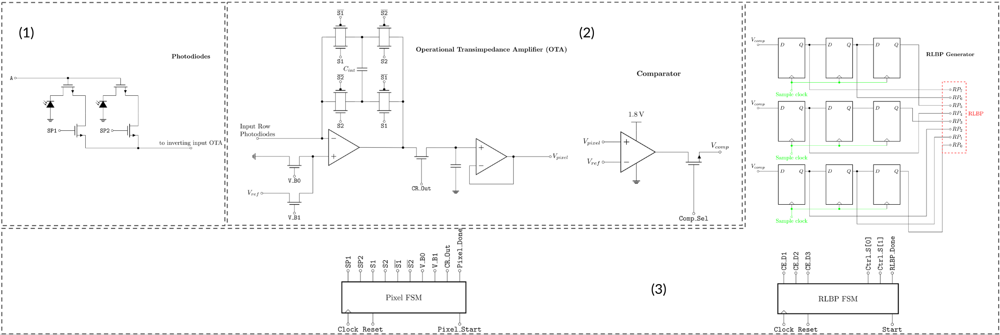

## Digital block

Sequential Logic:
* Pixel Controller: Finite State Machine
* Pixel Address Generator: Counters
* Time Integration Controllers: Timers
* RLBP Generator: Shift Registers + 1:4 Demultiplexer
* RLBP Controller: Finite State Machine
Combinational Logic:
* Bus to 3x3 Array: Demultiplexers


##Analog block
* Smart Pixel: Photodiodes + OTA + Capacitor (Integrator)
* Switches for Capacitor, Photodiodes, Output, and Biasing: Transmission Gates and NMOS Switches
* Buffer: based on OTA
* Comparator: based on OTA


## Datapath structure
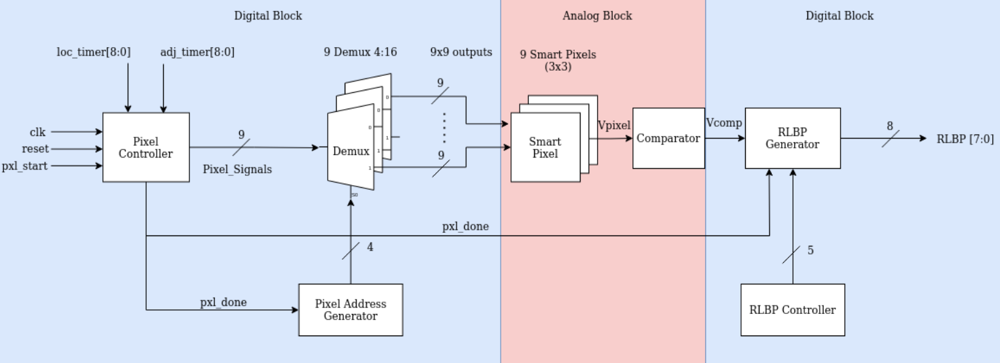

## Block diagram of the digital part
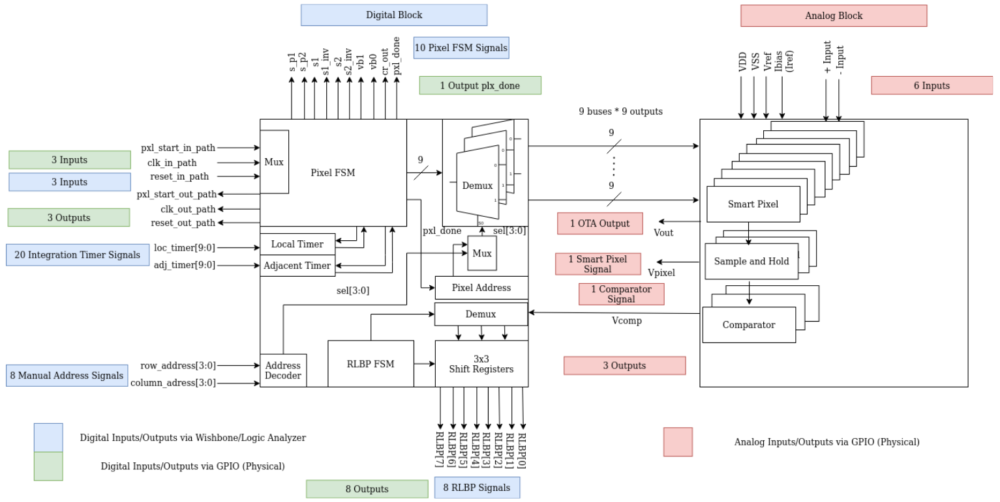

## Operational Transimpedance Amplifier OTA

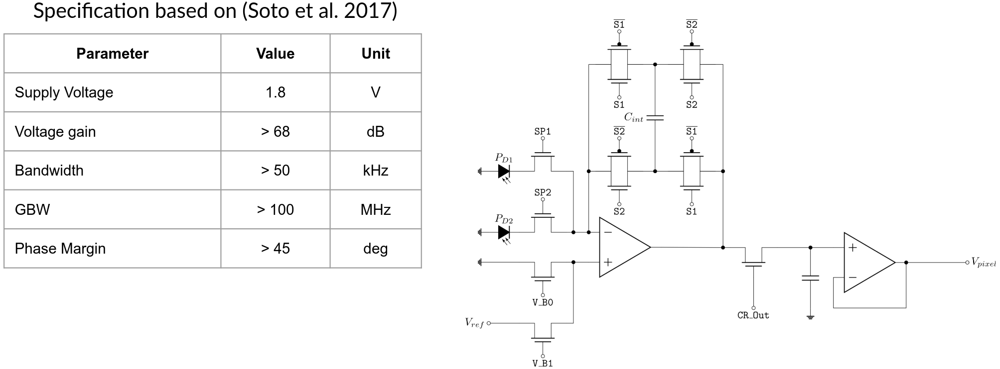

 ## Ring Local Binary Pattern Generator RLBP
The RLBP holds the information about the local gradients along the pixel matrix,
The binary information is generated using  
an OTA based comparator and a demultiplexer.

Finally, the RLBP register is exposed
on IO pins and also can be accessed
by Caravel using Wishbone bus.

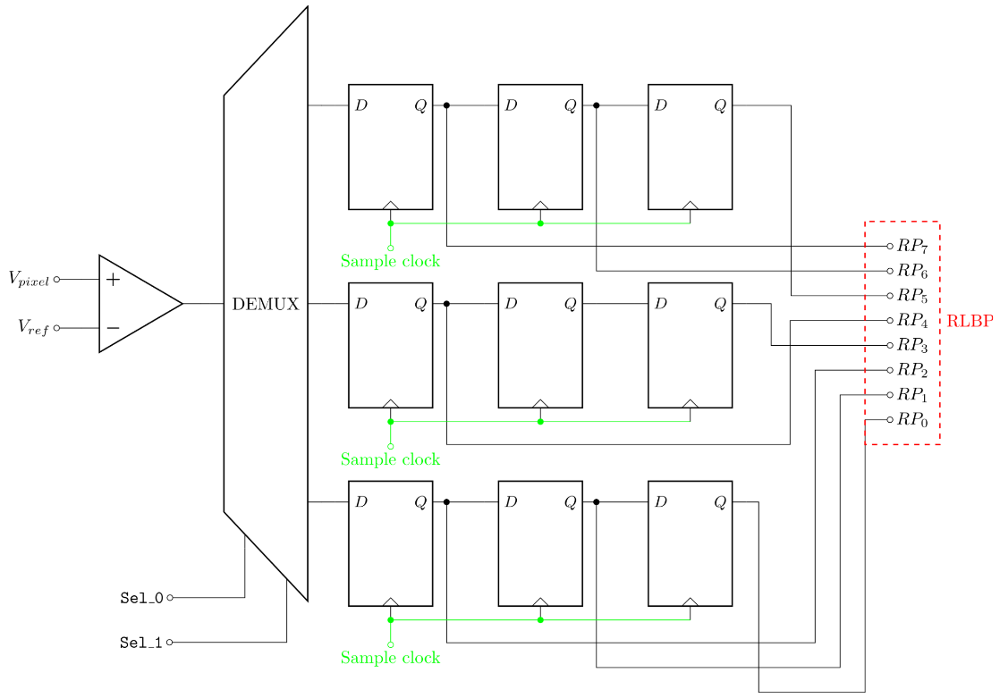

## Functional Explanation
Pixel Controller (one of the FSM of the RLBP block) generates the signals that control the switches of photodiodes and the OTA (Smart Pixel). In order to generate a bus for each signal, demultiplexers are used. The integration time is controlled by two timers, one for a local pixel (photodiode) and one for adjacent or right neighbor pixel. The OTA outputs a voltage proportional to the current of the photodiode. To generate the comparison, the polarity of the capacitor is flipped, so the local pixel generates a positive slope of voltage and the adjacent pixel a negative slope; the end voltage will be determined (dominated) by which photodiode has been exposed to more light.
To control which one of the smart pixels is currently active, a counter is used as a pixel address generator. Once a voltage value outputs the OTA, it is hold by a sample and hold circuit and then compared with a reference voltage, which determines if it crossed the threshold value of brightness (1) or darkness (0). The discrete value is then saved in a shift register (RLBP Generator). This is done 9 times in order to get an 8 bit pattern that describes a histogram of the array of 4x3 photodiodes.


# Tools Installation

In [ ]:
#@title Install dependencies {display-mode: "form"}
#@markdown - Click the ▷ button to setup the digital design environment based on [conda-eda](https://github.com/hdl/conda-eda).

openlane_version = 'latest' #@param {type:"string"}
open_pdks_version = 'latest' #@param {type:"string"}

if openlane_version == 'latest':
  openlane_version = ''
if open_pdks_version == 'latest':
  open_pdks_version = ''

import os
import pathlib
import sys

!curl -Ls https://micro.mamba.pm/api/micromamba/linux-64/latest | tar -xj bin/micromamba
conda_prefix_path = pathlib.Path('conda-env')
CONDA_PREFIX = str(conda_prefix_path.resolve())
!bin/micromamba create --yes --prefix $CONDA_PREFIX
!echo 'python ==3.7*' >> {CONDA_PREFIX}/conda-meta/pinned
!CI=0 bin/micromamba install --yes --prefix $CONDA_PREFIX \
                     --channel litex-hub \
                     --channel main \
                     openlane={openlane_version} \
                     open_pdks.sky130a={open_pdks_version} \
                     magic \
                     openroad \
                     netgen \
                     iverilog \
                     yosys 
!python -m pip install --no-binary gdstk gdstk
PATH = os.environ['PATH']
%env CONDA_PREFIX={CONDA_PREFIX}
%env PATH={CONDA_PREFIX}/bin:{PATH}
site_package_path = conda_prefix_path / 'lib/python3.7/site-packages'
sys.path.append(str(site_package_path.resolve()))

## Clone the github repository.

This repository contains: 
* RTL files of the digital macro
* Analog files of the analog macros (.mag, .gds, .lef)
* Openlane flow scripts
* user_project_wrapper configurations

In [ ]:
# !rm -rI MixPix_Colab

In [ ]:
!git clone https://github.com/HALxmont/MixPix_Colab.git

Cloning into 'MixPix_Colab'...
remote: Enumerating objects: 167, done.
remote: Counting objects: 100% (167/167), done.
remote: Compressing objects: 100% (114/114), done.
remote: Total 167 (delta 64), reused 144 (delta 44), pack-reused 0
Receiving objects: 100% (167/167), 1.11 MiB | 9.73 MiB/s, done.
Resolving deltas: 100% (64/64), done.


In [ ]:
#set the PDK
%env PDK=sky130A

env: PDK=sky130A


In [ ]:
#copy the RLBP design to the ...openlane/design folder
!cp -r /content/MixPix_Colab/openlane/rlbp /content/conda-env/share/openlane/designs/

##Harden the RLBP (digital macro). RTL-GDSII flow

In [ ]:
!flow.tcl -design rlbp

OpenLane 2023.03.01_0_ge10820ec-conda
All rights reserved. (c) 2020-2022 Efabless Corporation and contributors.
Available under the Apache License, version 2.0. See the LICENSE file for more details.

[INFO]: Using configuration in 'conda-env/share/openlane/designs/rlbp/config.tcl'...
[INFO]: PDK Root: /content/conda-env/share/pdk
[INFO]: Process Design Kit: sky130A
[INFO]: Standard Cell Library: sky130_fd_sc_hd
[INFO]: Optimization Standard Cell Library: sky130_fd_sc_hd
[INFO]: Run Directory: /content/conda-env/share/openlane/designs/rlbp/runs/RUN_2023.03.09_14.15.03
[INFO]: Preparing LEF files for the nom corner...
[INFO]: Preparing LEF files for the min corner...
[INFO]: Preparing LEF files for the max corner...
[STEP 1]
[INFO]: Running Synthesis (log: conda-env/share/openlane/designs/rlbp/runs/RUN_2023.03.09_14.15.03/logs/synthesis/1-synthesis.log)...
[STEP 2]
[INFO]: Running Single-Corner Static Timing Analysis (log: conda-env/share/openlane/designs/rlbp/runs/RUN_2023.03.09_14.15.

## Create the enviroment for the wrapper

In [ ]:
#create the main directories of the gds, lef, and mag files of the project
!mkdir gds
!mkdir lef
!mkdir mag

In [ ]:
#find the last rlbp gds
gdss = sorted(pathlib.Path('/content/conda-env/share/openlane/designs/rlbp/runs').glob('*/results/final/gds/*.gds'))
gds_path_rlbp = gdss[-1]

In [ ]:
#find the last rlbp lef
lef = sorted(pathlib.Path('/content/conda-env/share/openlane/designs/rlbp/runs').glob('*/results/final/lef/*.lef'))
lef_path_rlbp = lef[-1]

In [ ]:
#find the last rlbp mag
mag = sorted(pathlib.Path('/content/conda-env/share/openlane/designs/rlbp/runs').glob('*/results/final/mag/*.mag'))
mag_path_rlbp = lef[-1]

In [ ]:
# move gds_rlbp, lef_rlb, mag_rlbp to the respectives gds, lef, mag main directories
!cp $gds_path_rlbp '/content/gds/'
!cp $lef_path_rlbp '/content/lef/'
!cp $mag_path_rlbp '/content/mag/'

In [ ]:
#move the analog files (gds, mag, lef) to the to respectives gds, lef, mag main directories
!cp '/content/MixPix_Colab/analog_files/gds/PD_M1_M2.gds' '/content/gds/'
!cp '/content/MixPix_Colab/analog_files/gds/SystemLevel.gds' '/content/gds/'

!cp '/content/MixPix_Colab/analog_files/lef/PD_M1_M2.lef' '/content/lef/'
!cp '/content/MixPix_Colab/analog_files/lef/SystemLevel.lef' '/content/lef/'

!cp '/content/MixPix_Colab/analog_files/mag/PD_M1_M2.mag' '/content/mag/'
!cp '/content/MixPix_Colab/analog_files/mag/SystemLevel.mag' '/content/mag/'


In [ ]:
## copy the project macro to the ...openlane/design folder
!cp -r /content/MixPix_Colab/openlane/user_project_wrapper /content/conda-env/share/openlane/designs/

## Harden the user_project_wrapper 
### At the end you will get the MixPix circuit ready to be intregated with Caravel project !!

In [ ]:
!flow.tcl -design user_project_wrapper

OpenLane 2023.03.01_0_ge10820ec-conda
All rights reserved. (c) 2020-2022 Efabless Corporation and contributors.
Available under the Apache License, version 2.0. See the LICENSE file for more details.

[INFO]: Using configuration in 'conda-env/share/openlane/designs/user_project_wrapper/config.tcl'...
[INFO]: PDK Root: /content/conda-env/share/pdk
[INFO]: Process Design Kit: sky130A
[INFO]: Standard Cell Library: sky130_fd_sc_hd
[INFO]: Optimization Standard Cell Library: sky130_fd_sc_hd
[INFO]: Run Directory: /content/conda-env/share/openlane/designs/user_project_wrapper/runs/RUN_2023.03.09_20.47.24
[INFO]: Preparing LEF files for the nom corner...
[INFO]: Preparing LEF files for the min corner...
[INFO]: Preparing LEF files for the max corner...
[STEP 1]
[INFO]: Running Synthesis (log: conda-env/share/openlane/designs/user_project_wrapper/runs/RUN_2023.03.09_20.47.24/logs/synthesis/1-synthesis.log)...
[STEP 2]
[INFO]: Running Single-Corner Static Timing Analysis (log: conda-env/share/

## Layout view

In [ ]:
import pathlib
import gdstk
from IPython.display import SVG, display, HTML
import base64


gdss = sorted(pathlib.Path('/content/conda-env/share/openlane/designs/user_project_wrapper/runs').glob('*/results/final/gds/*.gds'))
library = gdstk.read_gds(gdss[-1])
top_cells = library.top_level()
top_cells[0].write_svg('MixPix.svg',scaling=0.2, precision=1, pad="1%")

IPython.display.SVG('MixPix.svg')

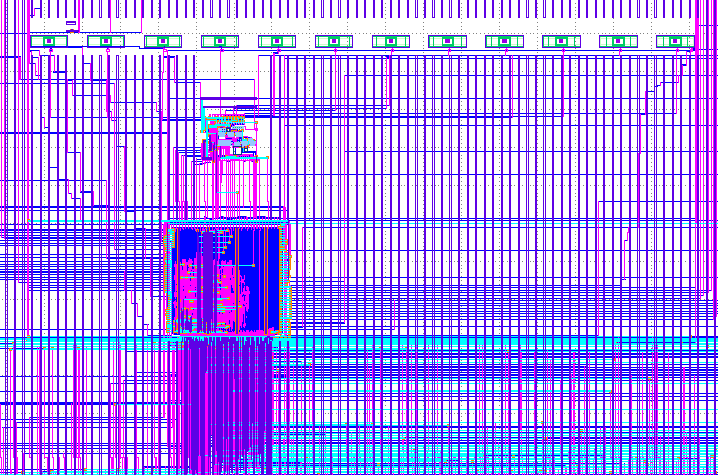

# Dump flow report


In [ ]:
import pandas as pd
import pathlib

pd.options.display.max_rows = None
final_summary_reports = sorted(pathlib.Path('/content/conda-env/share/openlane/designs/user_project_wrapper/runs').glob('*/reports/metrics.csv'))
df = pd.read_csv(final_summary_reports[-1])
df.transpose()

,0
design,/content/conda-env/share/openlane/designs/user...
design_name,user_project_wrapper
config,RUN_2023.03.09_20.47.24
flow_status,flow completed
total_runtime,0h8m21s0ms
routed_runtime,0h6m55s0ms
(Cell/mm^2)/Core_Util,-2.0
DIEAREA_mm^2,-1
CellPer_mm^2,-1
OpenDP_Util,-1
